# CosmoCentral usage example (by Marco Bonici and Carmelita Carbone)
In this notebook it's showed how to use CosmoCentral to compute the angular coefficients $C_\ell$'s. Let us start importing the necessary modules.

In [1]:
using CosmoCentral
using BenchmarkTools
using Plots
using GR
using LaTeXStrings
using NPZ

## Cosmology

The first object we instantiate is the Cosmology. In this moment, we canNPZnstantiate only a $w_0 w_a$CDM cosmology. We instantiate  it with the default parameters:
- $\Omega_M = 0.32$
- $\Omega_B = 0.05$
- $h = 0.67$
- $n_s = 0.96$
- $\sigma_8 = 0.816$
- $M_\nu = 0.06\,\mathrm{eV}$
- $w_0 = -1$
- $w_a = 0$

In [2]:
w0waCDMCosmology = CosmoCentral.Flatw0waCDMCosmology()

CosmoCentral.Flatw0waCDMCosmology{Float64}(-1.0, 0.0, 0.06, 67.0, 0.32, 0.05, 0.0, 0.96, 0.816)

We can now instantiate also the Cosmological Grid, which contains:
- ZArray, the $z$ redshift array
- KArray, the $k$ momentum array
- ℓBinCenters, the $\ell$ multipole array

While the last one sets the multipoles that will be used to evaluate the $C_\ell$'s, the first two are precision settings: the higher their value, the higher the precision. The standard settings have shown a reliable stability and precision.

In [3]:
MultipolesArrayTemp = CosmoCentral.LogSpaced(10.,5000., 101)
MultipolesArray = zeros(100)

for i in 1:100
    MultipolesArray[i] = (MultipolesArrayTemp[i+1]+MultipolesArrayTemp[i])/2
end

CosmologicalGrid = CosmoCentral.CosmologicalGrid(ZArray = LinRange(0.001, 4., 10000), KArray = CosmoCentral.LogSpaced(1e-5, 50., 1000), ℓBinCenters = MultipolesArray);

## Density
The second object we want to instantiate is the galaxy density. Let us start from the source density, the expected galaxy density.

In this moment, we only implement the following analytical density:
$$
n(z) \propto\left(\frac{z}{z_{0}}\right)^{2} \exp \left[-\left(\frac{z}{z_{0}}\right)^{3 / 2}\right],
$$
with $z_0=0.9\sqrt{2}$.

In [4]:
AnalitycalDensity = CosmoCentral.AnalitycalDensity()
@benchmark CosmoCentral.NormalizeAnalitycalDensity!(AnalitycalDensity)

BenchmarkTools.Trial: 10000 samples with 1 evaluation.
 Range (min … max):  48.257 μs … 117.798 μs  ┊ GC (min … max): 0.00% … 0.00%
 Time  (median):     53.395 μs               ┊ GC (median):    0.00%
 Time  (mean ± σ):   55.359 μs ±   5.887 μs  ┊ GC (mean ± σ):  0.00% ± 0.00%

      ▇▆▄▅█▇▆▆▆▆▅▄▄▄▄▃▃▂▂▃▂▂▁▁▁▁ ▂▂▁    ▁▁   ▁ ▁▁              ▃
  █▇▅██████████████████████████████████▇████████████▇████▇▆▆▅▆ █
  48.3 μs       Histogram: log(frequency) by time        77 μs <

 Memory estimate: 5.14 KiB, allocs estimate: 188.

The analytical density is convolved with the probability distribution function $p_{\rm{ph}}(z_\rm{p}|z)$, describing the probability that a galaxy with redshift $z$ has a measured redshift $z_\rm{p}$:


$$
p_{\mathrm{ph}}\left(z_{\mathrm{p}} \mid z\right)=\frac{1-f_{\text {out }}}{\sqrt{2 \pi} \sigma_{\mathrm{b}}(1+z)} \exp \left\{-\frac{1}{2}\left[\frac{z-c_{\mathrm{b}} z_{\mathrm{p}}-z_{\mathrm{b}}}{\sigma_{\mathrm{b}}(1+z)}\right]^{2}\right\}+\frac{f_{\text {out }}}{\sqrt{2 \pi} \sigma_{\mathrm{o}}(1+z)} \exp \left\{-\frac{1}{2}\left[\frac{z-c_{\mathrm{o}} z_{\mathrm{p}}-z_{\mathrm{o}}}{\sigma_{\mathrm{o}}(1+z)}\right]^{2}\right\}.
$$


The object that contains the values of the parameters in the previous function is InstrumentResponse; the standard values are


$$
\begin{array}{ccccccc}
\hline c_{\mathrm{b}} & z_{\mathrm{b}} & \sigma_{\mathrm{b}} & c_{\mathrm{o}} & z_{\mathrm{o}} & \sigma_{\mathrm{o}} & f_{\text {out }} \\
\hline \hline 1.0 & 0.0 & 0.05 & 1.0 & 0.1 & 0.05 & 0.1 \\
\hline
\end{array}
$$

In [5]:
InstrumentResponse = CosmoCentral.InstrumentResponse()

CosmoCentral.InstrumentResponse{Float64}(1.0, 0.0, 0.05, 1.0, 0.1, 0.05, 0.1)

Now we can convolve the analytical density with the instrument response to obtain the galaxy density in the $i-$th bin, according to the following equation:

$$
n_{i}(z)=\frac{\int_{z_{i}^{-}}^{z_{i}^{+}} \mathrm{d} z_{\mathrm{p}} n(z) p_{\mathrm{ph}}\left(z_{\mathrm{p}} \mid z\right)}{\int_{z_{\min }}^{z_{\max }} \mathrm{d} z \int_{z_{i}^{-}}^{z_{i}^{+}} \mathrm{d} z_{\mathrm{p}} n(z) p_{\mathrm{ph}}\left(z_{\mathrm{p}} \mid z\right)}
$$

In [6]:
ConvolvedDensity = CosmoCentral.ConvolvedDensity(DensityGridArray = ones(10, length(CosmologicalGrid.ZArray)))
@benchmark CosmoCentral.NormalizeConvolvedDensity!(ConvolvedDensity, AnalitycalDensity, InstrumentResponse, CosmologicalGrid)

BenchmarkTools.Trial: 178 samples with 1 evaluation.
 Range (min … max):  24.360 ms … 47.182 ms  ┊ GC (min … max): 0.00% … 30.46%
 Time  (median):     26.870 ms              ┊ GC (median):    0.00%
 Time  (mean ± σ):   28.278 ms ±  4.164 ms  ┊ GC (mean ± σ):  3.41% ±  7.95%

    ▅█▃▅▅   ▁ ▂                                                
  ▄███████▆████▇▄▄▃▄▃▁▁▃▃▃▁▁▁▁▁▁▁▃▁▁▃▁▃▃▃▄▃▃▁▁▃▁▃▁▁▃▁▁▁▁▁▁▁▁▃ ▃
  24.4 ms         Histogram: frequency by time        44.9 ms <

 Memory estimate: 6.85 MiB, allocs estimate: 294623.

After the normalization we can evaluate the density over the cosmological grid, and plot it

In [7]:
@benchmark CosmoCentral.ComputeConvolvedDensityGrid!(CosmologicalGrid, ConvolvedDensity, AnalitycalDensity, InstrumentResponse)

BenchmarkTools.Trial: 8 samples with 1 evaluation.
 Range (min … max):  645.387 ms … 704.101 ms  ┊ GC (min … max): 3.25% … 3.50%
 Time  (median):     661.452 ms               ┊ GC (median):    3.44%
 Time  (mean ± σ):   668.099 ms ±  22.140 ms  ┊ GC (mean ± σ):  3.60% ± 0.51%

  █ █       █  █     █      █                            █    █  
  █▁█▁▁▁▁▁▁▁█▁▁█▁▁▁▁▁█▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁█ ▁
  645 ms           Histogram: frequency by time          704 ms <

 Memory estimate: 177.08 MiB, allocs estimate: 7227910.

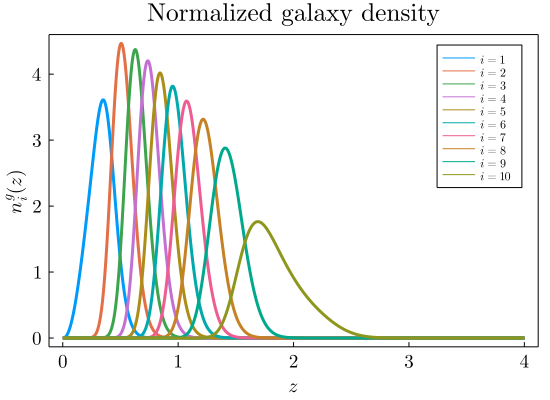

In [8]:
plot_font = "Computer Modern"

Plots.default(titlefont = (16, plot_font), fontfamily=plot_font,
        linewidth=2, framestyle=:box, fg_legend =:black, label=nothing, grid=false, tickfontsize=12, size = (550, 400), labelfontsize = 13, dpi = 200)

p = Plots.plot(xlabel=L"z", ylabel=L"n_i^g(z)",
    title="Normalized galaxy density")
for i in 1:10
Plots.plot!(p, CosmologicalGrid.ZArray, ConvolvedDensity.DensityGridArray[i,:],
    labels=(L"i=%$i"),  linewidth=3)
end
Plots.savefig(p, "galaxy_density.pdf")
p

## Background Quantities
Let us instantiate and evaluate the Background quantities over the redshift grid. In particular, we evaluate the Hubble rate:

$$
H(z)=H_0E(z)=H_0\sqrt{\Omega_{\mathrm{m}, 0}(1+z)^{3}+\Omega_{\mathrm{DE}, 0}(1+z)^{3\left(1+w_{0}+w_{a}\right)} \exp \left[-3 w_{a} \frac{z}{1+z}\right]+\Omega_{K, 0}(1+z)^{2}}
$$

and the comoving distance:

$$
r(z)=\frac{c}{H_{0}} \int_{0}^{z} \frac{\mathrm{d} z}{E(z)}
$$

In [9]:
BackgroundQuantities = CosmoCentral.BackgroundQuantities(HZArray= zeros(length(CosmologicalGrid.ZArray)), χZArray=zeros(length(CosmologicalGrid.ZArray)))
@benchmark CosmoCentral.ComputeBackgroundQuantitiesGrid!(CosmologicalGrid, BackgroundQuantities, w0waCDMCosmology)

BenchmarkTools.Trial: 101 samples with 1 evaluation.
 Range (min … max):  43.155 ms … 76.758 ms  ┊ GC (min … max): 0.00% … 19.60%
 Time  (median):     46.916 ms              ┊ GC (median):    0.00%
 Time  (mean ± σ):   49.616 ms ±  6.191 ms  ┊ GC (mean ± σ):  3.60% ±  7.07%

       ▁ █▆▃                                                   
  ▄▃▃▄▅█▆███▆▄▅▇▃▄▃▁▅▄▅▄▁▅▁▁▁▁▃▁▁▁▁▁▁▁▁▁▁▁▃▃▃▃▅▁▃▁▃▁▃▁▃▁▁▁▃▁▃ ▃
  43.2 ms         Histogram: frequency by time        67.1 ms <

 Memory estimate: 12.53 MiB, allocs estimate: 547035.

## Power Spectrum
Here we instantiate and run the Boltzmann solver CLASSY, which will compute the linear and the nonlinear matter power spectrum $P_{\delta\delta}(k,z)$. The nonlinear correction is implemented from the Takahashi revised halofit.

In [10]:
ClassyParams = CosmoCentral.Initializeclassy(w0waCDMCosmology)
PowerSpectrum = CosmoCentral.PowerSpectrum(PowerSpectrumLinArray = zeros(length(CosmologicalGrid.KArray), length(CosmologicalGrid.ZArray)),
    PowerSpectrumNonlinArray = zeros(length(CosmologicalGrid.KArray), length(CosmologicalGrid.ZArray)),
    InterpolatedPowerSpectrum = zeros(length(CosmologicalGrid.ℓBinCenters), length(CosmologicalGrid.ZArray)))
@time CosmoCentral.EvaluatePowerSpectrum!(ClassyParams, CosmologicalGrid, PowerSpectrum)

217.353370 seconds (265.26 M allocations: 6.948 GiB, 5.45% gc time, 0.13% compilation time)


After computing the power spectrum, we need to $\textit{interpolate}$ it: as we will write down later, we need $P_{\delta\delta}$ on a specific line in the $k-z$ space for each multipole $\ell$ to evaluate the $C_\ell$'s in the Limber approximation. The relationship between $k$ and $z$ is given by:

$$
k_\ell(z)=\frac{\ell+1/2}{r(z)}
$$

In [11]:
@benchmark CosmoCentral.ComputeLimberArray!(CosmologicalGrid, BackgroundQuantities)

BenchmarkTools.Trial: 705 samples with 1 evaluation.
 Range (min … max):  6.286 ms … 15.374 ms  ┊ GC (min … max): 0.00% … 34.83%
 Time  (median):     6.713 ms              ┊ GC (median):    0.00%
 Time  (mean ± σ):   7.075 ms ±  1.037 ms  ┊ GC (mean ± σ):  1.94% ±  6.16%

   ▆▅█▄▄▂▁                                                    
  ▇███████▇▆▅▅▅▃▄▄▄▃▃▂▃▃▃▂▂▂▂▂▂▃▂▂▁▁▂▂▂▃▂▂▂▂▁▃▂▃▃▃▃▃▃▂▂▂▂▃▂▃ ▃
  6.29 ms        Histogram: frequency by time        10.5 ms <

 Memory estimate: 7.66 MiB, allocs estimate: 1001.

In [12]:
@benchmark CosmoCentral.InterpolatePowerSpectrumLimberGrid!(CosmologicalGrid, BackgroundQuantities, PowerSpectrum, CosmoCentral.BSplineCubic())

BenchmarkTools.Trial: 6 samples with 1 evaluation.
 Range (min … max):  926.935 ms … 972.412 ms  ┊ GC (min … max): 2.39% … 4.06%
 Time  (median):     939.826 ms               ┊ GC (median):    2.23%
 Time  (mean ± σ):   944.241 ms ±  17.055 ms  ┊ GC (mean ± σ):  2.00% ± 1.34%

  █     █    █           █             █                      █  
  █▁▁▁▁▁█▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█ ▁
  927 ms           Histogram: frequency by time          972 ms <

 Memory estimate: 322.44 MiB, allocs estimate: 1311.

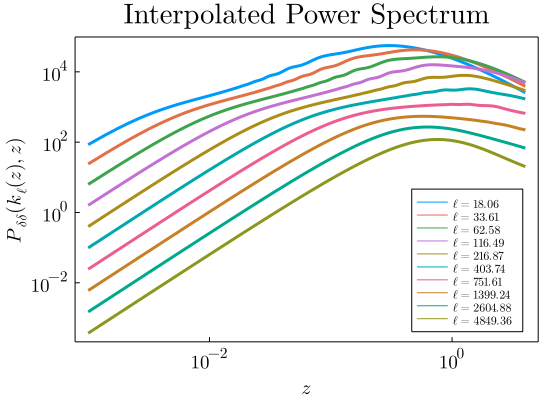

In [13]:
x = CosmologicalGrid.ZArray
Plots.default(titlefont = (18, plot_font), fontfamily=plot_font,
        linewidth=2, framestyle=:box, fg_legend =:black, label=nothing, grid=false, tickfontsize=12, size = (550, 400), labelfontsize = 13, dpi = 200)
p = Plots.plot(xlabel=L"z", ylabel=L"P_{\delta\delta}(k_\ell(z),z)",
    title="Interpolated Power Spectrum", legend=:bottomright)
for i in 1:10
    ℓ = round(CosmologicalGrid.ℓBinCenters[i*10], digits=2)
    y = PowerSpectrum.InterpolatedPowerSpectrum[i*10,:]
    Plots.plot!(p, x, y, labels=L"\ell=%$ℓ",  linewidth=3,  xaxis=:log, yaxis=:log)
end
p

In order to compute the Intrinsic Alignement, we need the Growth Factor, defined as:

$$
D(z)=\sqrt{\frac{P_\mathrm{lin}(k_\mathrm{min},z)}{P_\mathrm{lin}(k_\mathrm{min},z=0)}}
$$

In [14]:
@benchmark CosmoCentral.ExtractGrowthFactor!(BackgroundQuantities, PowerSpectrum)

BenchmarkTools.Trial: 447 samples with 1 evaluation.
 Range (min … max):   9.277 ms … 33.962 ms  ┊ GC (min … max): 0.00% … 66.98%
 Time  (median):     10.850 ms              ┊ GC (median):    0.00%
 Time  (mean ± σ):   11.163 ms ±  2.273 ms  ┊ GC (mean ± σ):  1.74% ±  6.30%

    ▁▂▅▂▅▇█▃▇▆▅▁                                               
  ▆▆████████████▆▆▆█▃▅▃▅▃▃▁▄▃▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂ ▃
  9.28 ms         Histogram: frequency by time        19.4 ms <

 Memory estimate: 1.66 MiB, allocs estimate: 78984.

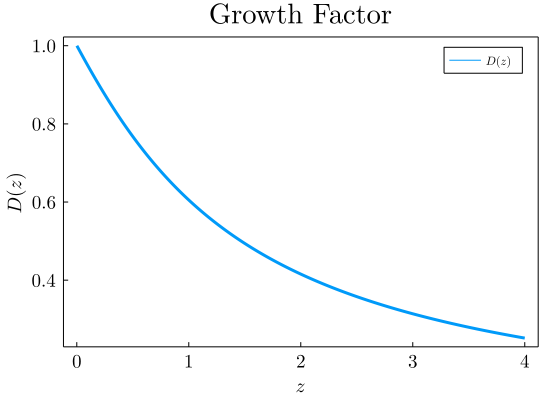

In [15]:
x = CosmologicalGrid.ZArray
y = BackgroundQuantities.DZArray
p = Plots.plot(xlabel=L"z", ylabel=L"D(z)",
    title="Growth Factor")
Plots.plot!(p, x, y, labels=L"D(z)",  linewidth=3)

## Weight Function
The next step is the evaluation of the Weight Function of the Galaxy Clustering. But before we need to instantiate and evaluate the Bias. 
Here we will use the Piecewise Bias of the IST:F :

$$
b_{i}(z)=\sqrt{1+\bar{z}}
$$

In [16]:
EuclidBias = CosmoCentral.PiecewiseBias();

In [17]:
GCWeightFunction = CosmoCentral.GCWeightFunction(WeightFunctionArray = zeros(length(ConvolvedDensity.DensityNormalizationArray), length(CosmologicalGrid.ZArray)), BiasKind = EuclidBias)
@benchmark CosmoCentral.ComputeBiasGrid!(CosmologicalGrid, GCWeightFunction, ConvolvedDensity)

BenchmarkTools.Trial: 316 samples with 1 evaluation.
 Range (min … max):  13.022 ms … 49.552 ms  ┊ GC (min … max): 0.00% … 60.34%
 Time  (median):     15.224 ms              ┊ GC (median):    0.00%
 Time  (mean ± σ):   15.831 ms ±  4.456 ms  ┊ GC (mean ± σ):  3.83% ±  9.22%

  ▁█ ▁█▄                                                       
  ██▇███▆▆▆▄▃▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▂▂ ▃
  13 ms           Histogram: frequency by time        42.7 ms <

 Memory estimate: 3.80 MiB, allocs estimate: 188979.

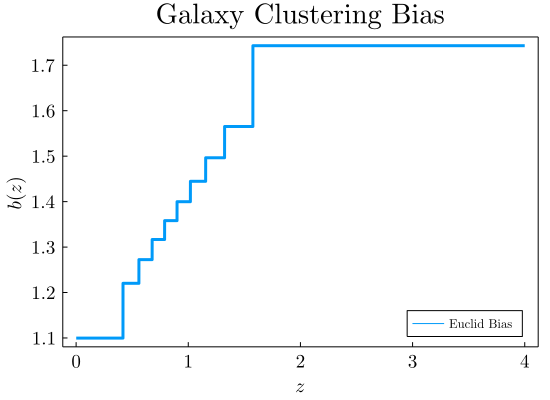

In [18]:
p = Plots.plot(xlabel=L"z", ylabel=L"b(z)",
    title="Galaxy Clustering Bias")
Plots.plot!(p, CosmologicalGrid.ZArray, GCWeightFunction.BiasArray[1,:],
    labels=("Euclid Bias"),  linewidth=3, legend = :bottomright)
p

Here we compute the Galaxy Clustering Weight function:

$$
W_{i}^{\mathrm{G}}(z)=b(z) n_{i}(z) \frac{H(z)}{c}
$$

In [19]:
@benchmark CosmoCentral.ComputeWeightFunctionGrid!(GCWeightFunction, ConvolvedDensity, CosmologicalGrid, BackgroundQuantities, w0waCDMCosmology)

BenchmarkTools.Trial: 154 samples with 1 evaluation.
 Range (min … max):  24.760 ms … 63.189 ms  ┊ GC (min … max): 0.00% … 43.47%
 Time  (median):     31.828 ms              ┊ GC (median):    0.00%
 Time  (mean ± σ):   32.471 ms ±  7.152 ms  ┊ GC (mean ± σ):  5.83% ± 12.06%

    ▃▂         ▁█▄                                             
  ▄▆██▆▃▃▃▄▅█▄▆███▇▄▆▃▃▅▄▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▃▁▁▃▄▃▃▃ ▃
  24.8 ms         Histogram: frequency by time        54.5 ms <

 Memory estimate: 13.58 MiB, allocs estimate: 789811.

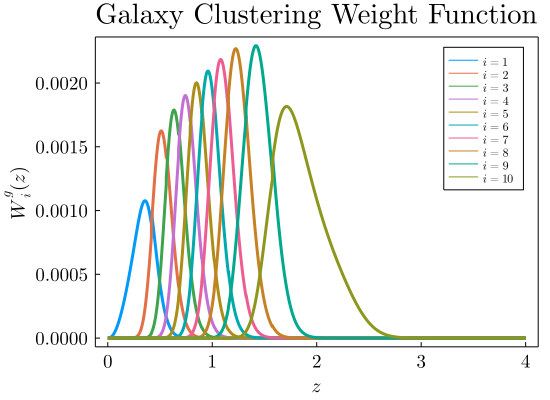

In [20]:
p = Plots.plot(xlabel=L"z", ylabel=L"W_i^g(z)",
    title="Galaxy Clustering Weight Function")
for i in 1:10
Plots.plot!(p, CosmologicalGrid.ZArray, GCWeightFunction.WeightFunctionArray[i,:],
    labels=(L"i=%$i"),  linewidth=3)
end
p

Let us save the array of the GC Weight Function.

In [29]:
NPZ.npzwrite("GC_WeightFunction.npy", GCWeightFunction.WeightFunctionArray)

The second object we want to study is the Lensing, whose weight function is given by:

$$
W_{i}^{\gamma}(z)=\frac{3}{2}\left(\frac{H_{0}}{c}\right)^{2} \Omega_{\mathrm{m}, 0}(1+z) r(z) \int_{z}^{z_{\max }} \mathrm{d} z^{\prime} n_{i}\left(z^{\prime}\right)\left[1-\frac{r(z)}{r\left(z^{\prime}\right)}\right]
$$

In [21]:
WLWeightFunction = CosmoCentral.WLWeightFunction(WeightFunctionArray = zeros(length(ConvolvedDensity.DensityNormalizationArray), length(CosmologicalGrid.ZArray)), LensingEfficiencyArray = zeros(length(ConvolvedDensity.DensityNormalizationArray), length(CosmologicalGrid.ZArray)), IntrinsicAlignmentArray = zeros(length(ConvolvedDensity.DensityNormalizationArray), length(CosmologicalGrid.ZArray)))
CosmoCentral.ComputeLensingEfficiencyGrid!(WLWeightFunction, ConvolvedDensity, CosmologicalGrid, BackgroundQuantities, w0waCDMCosmology, CosmoCentral.CustomLensingEfficiency())
@benchmark CosmoCentral.ComputeWeightFunctionGrid!(WLWeightFunction, ConvolvedDensity, CosmologicalGrid, BackgroundQuantities, w0waCDMCosmology)

BenchmarkTools.Trial: 124 samples with 1 evaluation.
 Range (min … max):  30.225 ms … 66.579 ms  ┊ GC (min … max): 0.00% … 38.82%
 Time  (median):     39.678 ms              ┊ GC (median):    0.00%
 Time  (mean ± σ):   40.649 ms ±  8.604 ms  ┊ GC (mean ± σ):  6.98% ± 12.75%

        ▃   ▂     ██▅▂                                         
  ▄▄▁▆▆▇█▇▅▁█▇█▆▆▅████▆▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▃▁▁▁▁▁▁▁▁▁▁▁▄▄▁▃▁▅▆▁▃ ▃
  30.2 ms         Histogram: frequency by time        64.9 ms <

 Memory estimate: 19.68 MiB, allocs estimate: 1189811.

In [22]:
size(WLWeightFunction.IntrinsicAlignmentArray)

(10, 10000)

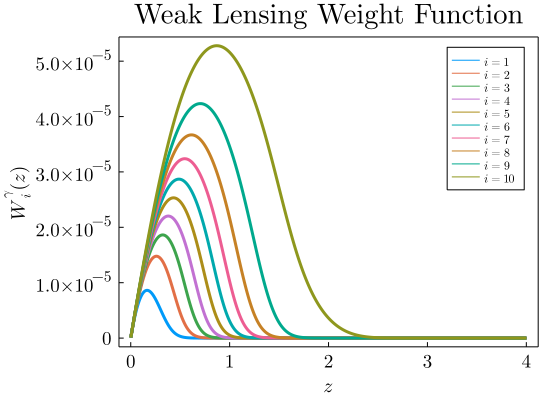

In [23]:
p = Plots.plot(xlabel=L"z", ylabel=L"W_i^\gamma(z)",
    title="Weak Lensing Weight Function")
for i in 1:10
Plots.plot!(p, CosmologicalGrid.ZArray, WLWeightFunction.WeightFunctionArray[i,:],
    labels=(L"i=%$i"),  linewidth=3)
end
p

This is not the only contribution to cosmic shear: we need to include also the Intrinsic Alignment (IA)

$$
W_{i}^{\mathrm{IA}}(z)=-\mathcal{A}_{\mathrm{IA}} C_{\mathrm{IA}} \Omega_{\mathrm{m}, 0} \frac{(1+z)^{\eta_{\mathrm{IA}}}\left[\langle L\rangle(z) / L_{\star}(z)\right]^{\beta_{\mathrm{IA}}}}{D(z)}\frac{H(z)}{c} n_{i}(z) 
$$

where the parameters have the following fiducial values

$$
\begin{array}{cccc}
\hline \mathcal{A}_{\mathrm{IA}} & C_{\mathrm{IA}} & \eta_{\mathrm{IA}} & \beta_{\mathrm{IA}} \\
\hline \hline 1.72 & 0.0134 & -0.41 & 0\\
\hline
\end{array}
$$

Here is the $\color{red}{\mathrm{main}}$ $\color{red}{\mathrm{difference}}$ with respect the IST:F paper, since they have set $\beta_{\mathrm{IA}}=2.17$ .

In [24]:
WLWeightFunction.IntrinsicAlignmentModel.βIA = 0
@benchmark CosmoCentral.ComputeIntrinsicAlignmentGrid!(CosmologicalGrid, WLWeightFunction, ConvolvedDensity, BackgroundQuantities, w0waCDMCosmology)

BenchmarkTools.Trial: 53 samples with 1 evaluation.
 Range (min … max):  76.286 ms … 133.403 ms  ┊ GC (min … max): 0.00% … 0.00%
 Time  (median):     92.982 ms               ┊ GC (median):    0.00%
 Time  (mean ± σ):   95.808 ms ±  13.256 ms  ┊ GC (mean ± σ):  4.84% ± 8.43%

      ▃            ▁▁█▆ ▃                                       
  ▄▄▁▁█▇▁▄▁▇▄▄▁▁▇▄▄████▁█▁▁▁▄▁▄▁▁▁▁▄▄▁▁▁▁▄▁▄▁▄▄▇▁▄▁▇▁▁▁▁▁▁▁▁▁▄ ▁
  76.3 ms         Histogram: frequency by time          127 ms <

 Memory estimate: 33.58 MiB, allocs estimate: 2057563.

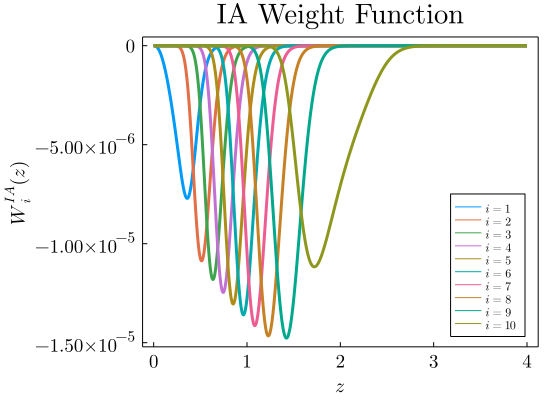

In [25]:
p = Plots.plot(xlabel=L"z", ylabel=L"W_i^{IA}(z)",
    title="IA Weight Function")
for i in 1:10
Plots.plot!(p, CosmologicalGrid.ZArray, WLWeightFunction.IntrinsicAlignmentArray[i,:],
    labels=(L"i=%$i"),  linewidth=3, legend = :bottomright)
end
p

We can now compute and plot the cosmic shear weight function with the IA contribution. In order to enlighten the IA contribution, we plot the total (Lensing+IA) weight function with solid lines and the Lensing alone weight function with dot-dash lines

In [26]:
@benchmark CosmoCentral.ComputeWeightFunctionGrid!(WLWeightFunction, ConvolvedDensity, CosmologicalGrid, BackgroundQuantities, w0waCDMCosmology)

BenchmarkTools.Trial: 126 samples with 1 evaluation.
 Range (min … max):  28.652 ms … 72.695 ms  ┊ GC (min … max): 0.00% … 38.98%
 Time  (median):     38.281 ms              ┊ GC (median):    0.00%
 Time  (mean ± σ):   39.814 ms ±  8.918 ms  ┊ GC (mean ± σ):  7.12% ± 12.90%

       ▁      ▁▄█▃                                             
  ▄▁▃▅▅█▆█▄▆▆▁████▅▄▅▁▃▃▃▄▄▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▄▄▁▄▃▁▁▄▃▁▁▁▁▁▁▁▃ ▃
  28.7 ms         Histogram: frequency by time        70.1 ms <

 Memory estimate: 19.68 MiB, allocs estimate: 1189811.

In [27]:
p = Plots.plot(xlabel=L"z", ylabel=L"W_i^L(z)",
    title="Cosmic Shear Weight Function")
for i in 1:10
Plots.plot!(p, CosmologicalGrid.ZArray, WLWeightFunction.WeightFunctionArray[i,:],
    labels=(L"i=%$i"),  linewidth=3, color=i)
Plots.plot!(p, CosmologicalGrid.ZArray, WLWeightFunction.WeightFunctionArray[i,:]-WLWeightFunction.IntrinsicAlignmentArray[i,:],
    linewidth=3, color=i, style = :dashdot)
end
p

In [30]:
NPZ.npzwrite("WL_WeightFunction_zNLA.npy", WLWeightFunction.WeightFunctionArray)

# Angular Coefficients

We can finally compute the angular coefficients in the Limber approximation. In the particular, the angular correlation between two probes $A$ and $B$ is given by:

$$
C_{i j}^{\mathrm{AB}}(\ell)=\frac{c}{H_{0}} \int \mathrm{d} z \frac{W_{i}^{\mathrm{A}}(z) W_{j}^{\mathrm{B}}(z)}{E(z) r^{2}(z)} P_{\mathrm{\delta\delta}}\left[\frac{\ell+1 / 2}{r(z)}, z\right]
$$

In [28]:
CℓLL = CosmoCentral.Cℓ(CℓArray = zeros(length(CosmologicalGrid.ℓBinCenters), length(GCWeightFunction.WeightFunctionArray[:, 1]), length(GCWeightFunction.WeightFunctionArray[:, 1])))
CℓGG = CosmoCentral.Cℓ(CℓArray = zeros(length(CosmologicalGrid.ℓBinCenters), length(GCWeightFunction.WeightFunctionArray[:, 1]), length(GCWeightFunction.WeightFunctionArray[:, 1])))
CℓGL = CosmoCentral.Cℓ(CℓArray = zeros(length(CosmologicalGrid.ℓBinCenters), length(GCWeightFunction.WeightFunctionArray[:, 1]), length(GCWeightFunction.WeightFunctionArray[:, 1])))
@benchmark CosmoCentral.ComputeCℓ!(CℓLL, WLWeightFunction, WLWeightFunction, BackgroundQuantities, w0waCDMCosmology, CosmologicalGrid, PowerSpectrum, CosmoCentral.CustomSimpson())

BenchmarkTools.Trial: 86 samples with 1 evaluation.
 Range (min … max):  46.318 ms … 105.449 ms  ┊ GC (min … max): 0.00% … 0.00%
 Time  (median):     55.679 ms               ┊ GC (median):    0.00%
 Time  (mean ± σ):   58.506 ms ±  10.754 ms  ┊ GC (mean ± σ):  0.00% ± 0.00%

  ▄▄     ▁▃█▃▁  ▃     ▁                                         
  ██▄▁▁▆▁█████▄▄█▆▄▄▇▄█▇▄▇▆▄▄▁▁▁▄▁▄▄▁▄▄▁▁▄▄▁▁▁▁▄▁▇▄▁▁▁▁▁▁▁▁▄▁▄ ▁
  46.3 ms         Histogram: frequency by time         87.2 ms <

 Memory estimate: 78.28 KiB, allocs estimate: 9.

In [ ]:
CosmoCentral.ComputeCℓ!(CℓLL, WLWeightFunction, WLWeightFunction, BackgroundQuantities, w0waCDMCosmology, CosmologicalGrid, PowerSpectrum, CosmoCentral.CustomSimpson())

In [ ]:
CosmoCentral.ComputeCℓ!(CℓGL, GCWeightFunction, WLWeightFunction, BackgroundQuantities, w0waCDMCosmology, CosmologicalGrid, PowerSpectrum, CosmoCentral.CustomSimpson())

In [ ]:
CosmoCentral.ComputeCℓ!(CℓGG, GCWeightFunction, GCWeightFunction, BackgroundQuantities, w0waCDMCosmology, CosmologicalGrid, PowerSpectrum, CosmoCentral.CustomSimpson())

We can finally plot the $C_\ell$'s for the diagonal tomographic pairs. It's worth emphasizing that we are going to plot the absoule values of the cross-correlation coefficients, since there are some negative values

In [ ]:
x = CosmologicalGrid.ℓBinCenters
p = Plots.plot(xlabel=L"\ell", ylabel=L"\ell(\ell+1)C_{ii}^{LL}",
    title="Weak Lensing", legend=:topleft)
for i in 1:10
    y =
    CℓLL.CℓArray[:,i,i] .* CosmologicalGrid.ℓBinCenters .*(CosmologicalGrid.ℓBinCenters .+1)
    Plots.plot!(p, x, y, labels=(L"i=%$i"),  linewidth=3, xaxis=:log, yaxis=:log, color = i)
end
p

In [ ]:
x = CosmologicalGrid.ℓBinCenters
p = Plots.plot(xlabel=L"\ell", ylabel=L"\ell(\ell+1)C_{ii}^{GG}",
    title="Galaxy Clustering", legend=:bottomright)
for i in 1:10
    y =
    CℓGG.CℓArray[:,i,i] .* CosmologicalGrid.ℓBinCenters .*(CosmologicalGrid.ℓBinCenters .+1)
    Plots.plot!(p, x, y, labels=(L"i=%$i"),  linewidth=3, xaxis=:log, yaxis=:log, color = i)
end
p

In [ ]:
x = CosmologicalGrid.ℓBinCenters
p = Plots.plot(xlabel=L"\ell", ylabel=L"\ell(\ell+1)C_{ii}^{GL}",
    title="Galaxy-Galaxy Lensing", legend=:bottomright)
for i in 1:10
    y =
    CℓGL.CℓArray[:,i,i] .* CosmologicalGrid.ℓBinCenters .*(CosmologicalGrid.ℓBinCenters .+1)
    if any(x->x<=0, y)
        Plots.plot!(p, x, abs.(y), labels=(L"i=%$i"),  linewidth=3, xaxis=:log, yaxis=:log)
    else
        Plots.plot!(p, x, abs.(y), labels=(L"i=%$i"),  linewidth=3, xaxis=:log, yaxis=:log)
    end
end
p